In [59]:
from argparse import Namespace
""
args = Namespace()
args.in_dir = '/projects/grail/portrait-rephotography/dataset/aligned2/historical_samples/'
args.denoised_dir = '/projects/grail/portrait-rephotography/dataset/aligned2/historical_samples_denoised/'
args.out_dir = 'fft'
args.thresh = 0.8 # 0.8 alias on high details for some images. 0.85 safe cutoff

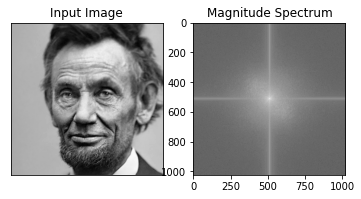

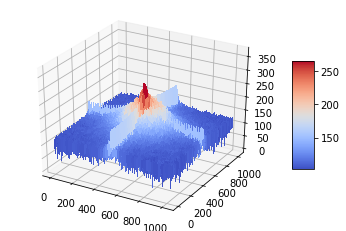

frequency=138, resolution=276


/homes/grail/xuanluo/anaconda3/envs/colorization/lib/python3.7/site-packages/ipykernel_launcher.py:87: RuntimeWarning: divide by zero encountered in log


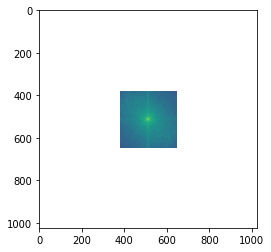

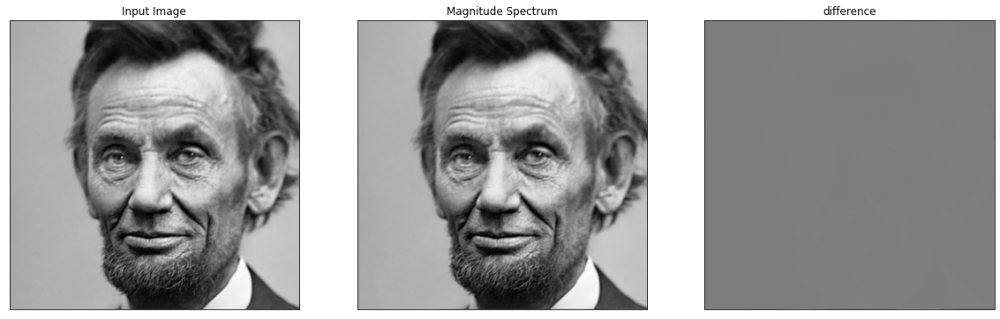

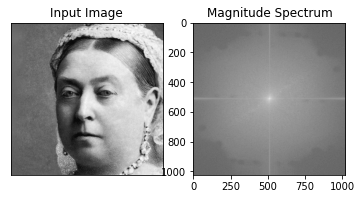

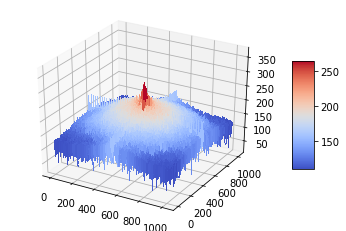

frequency=260, resolution=520


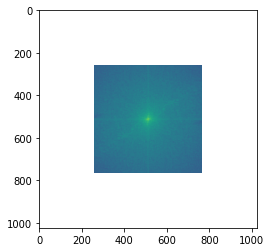

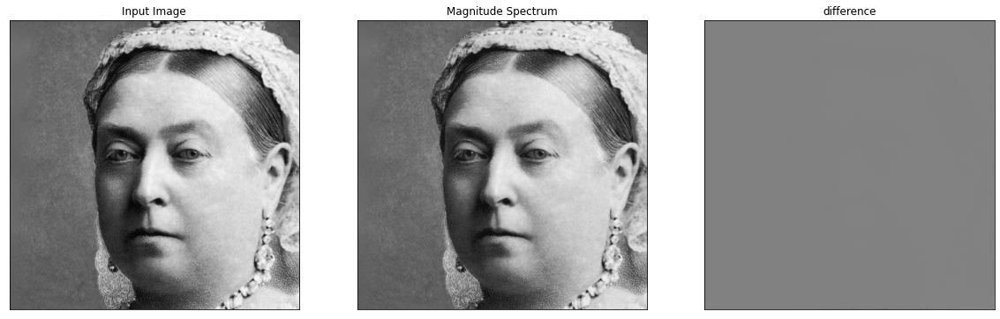

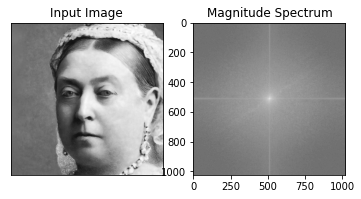

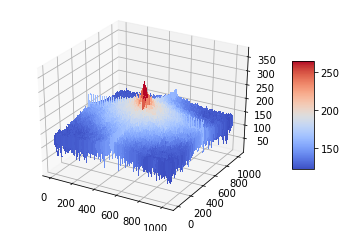

frequency=267, resolution=534


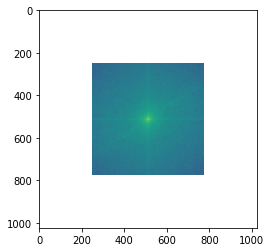

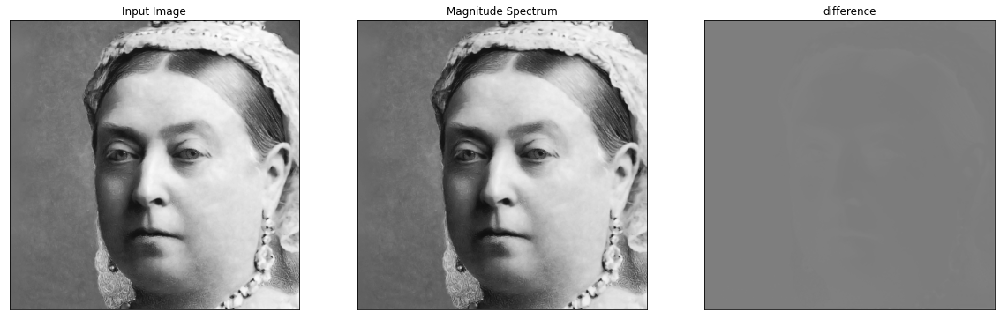

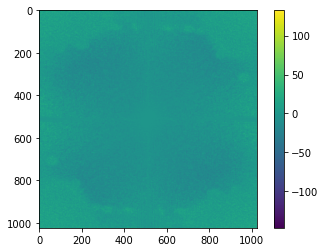

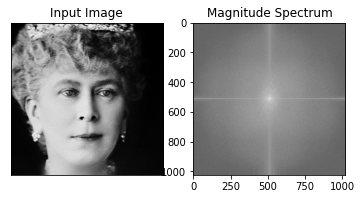

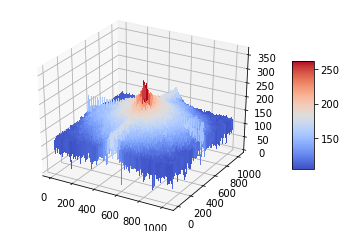

frequency=226, resolution=452


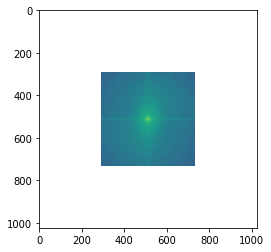

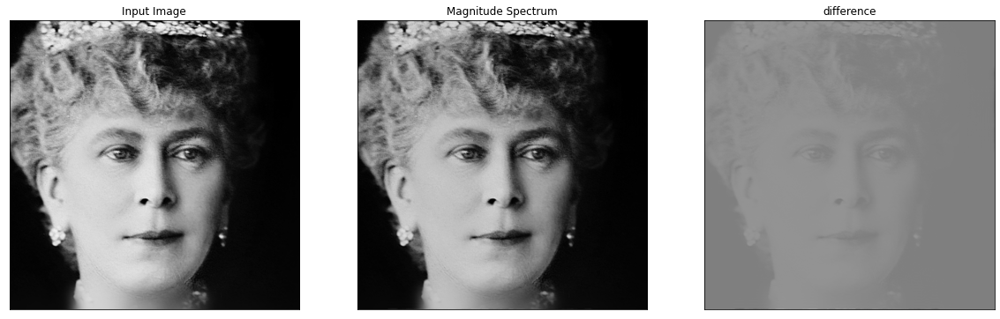

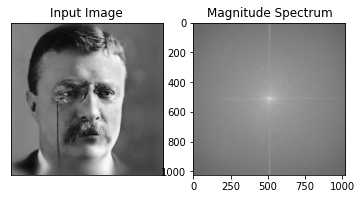

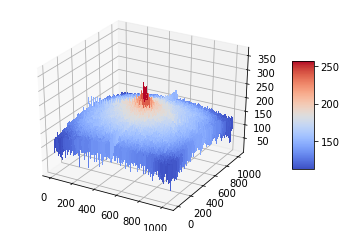

frequency=297, resolution=594


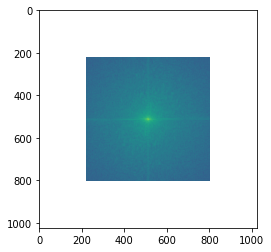

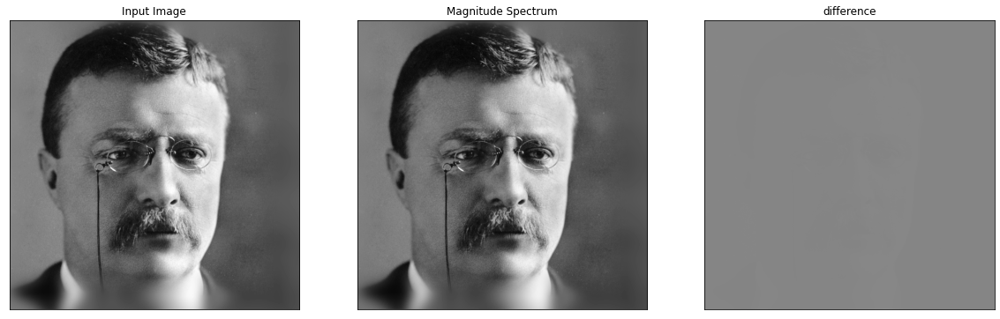

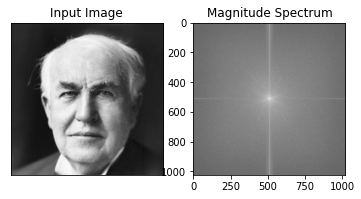

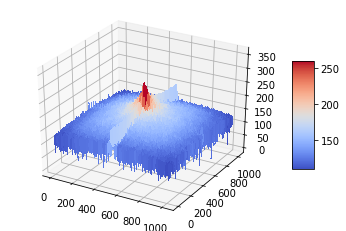

frequency=260, resolution=520


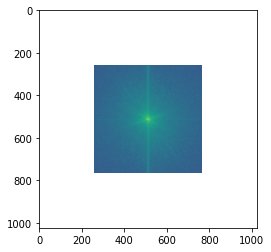

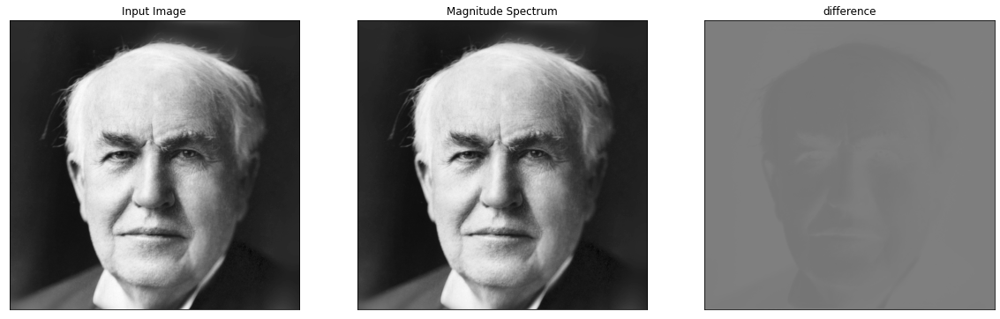

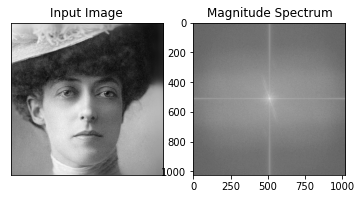

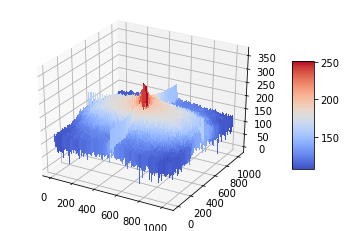

frequency=282, resolution=564


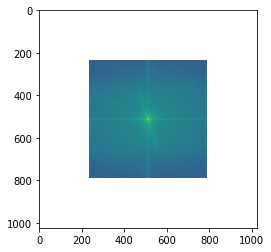

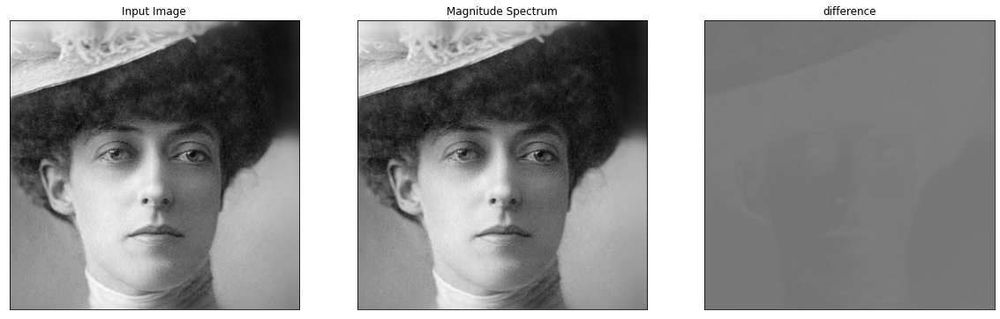

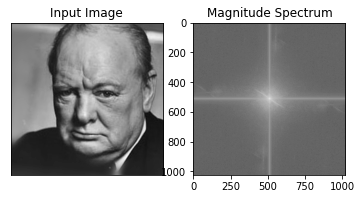

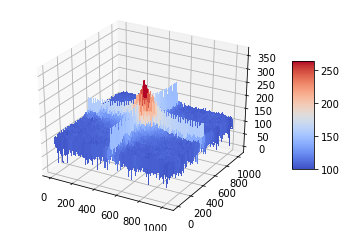

frequency=107, resolution=214


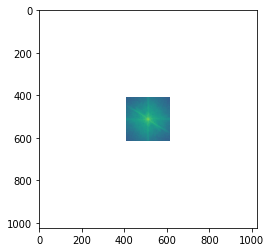

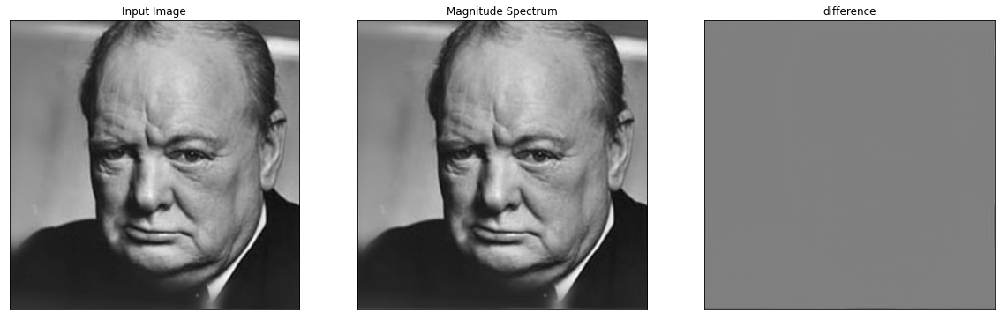

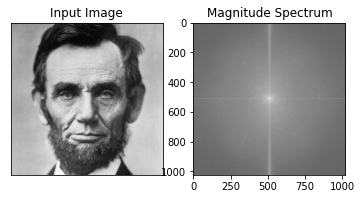

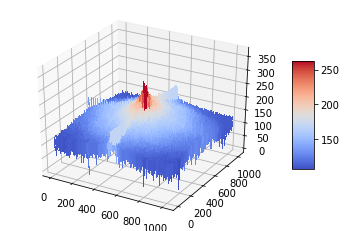

frequency=244, resolution=488


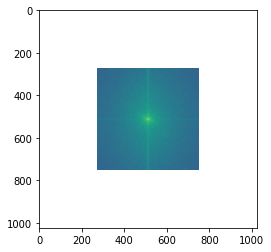

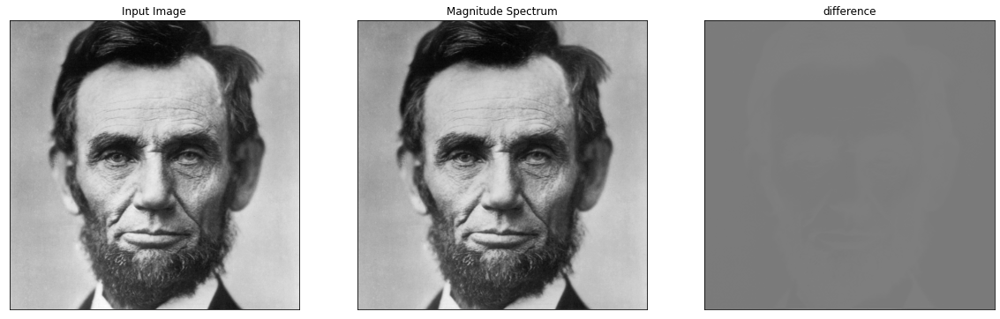

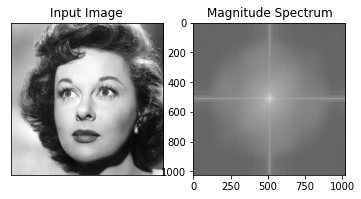

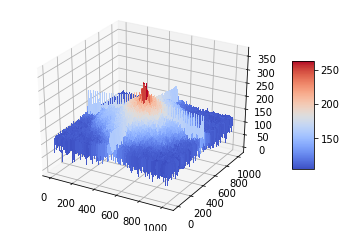

frequency=192, resolution=384


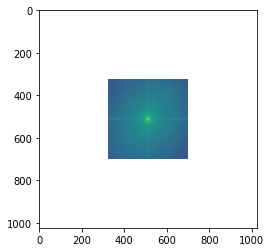

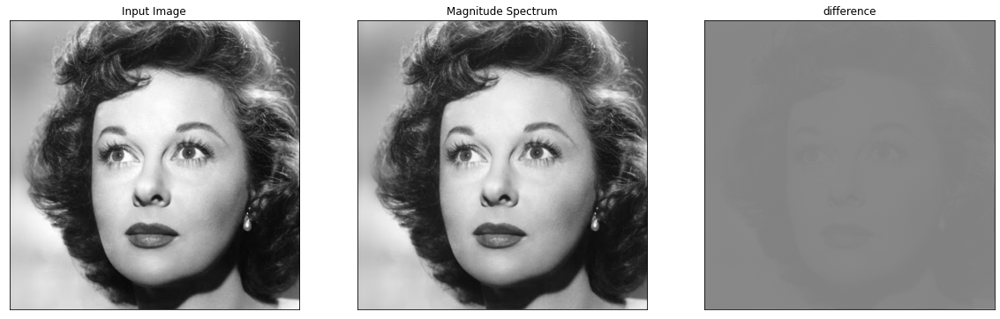

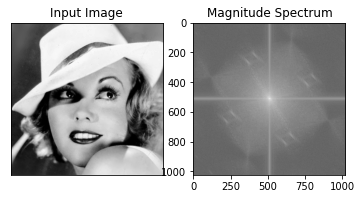

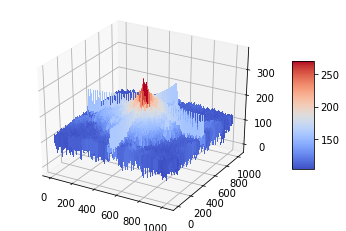

frequency=165, resolution=330


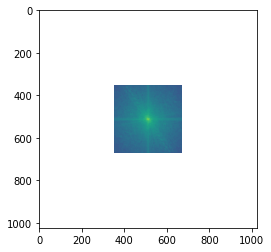

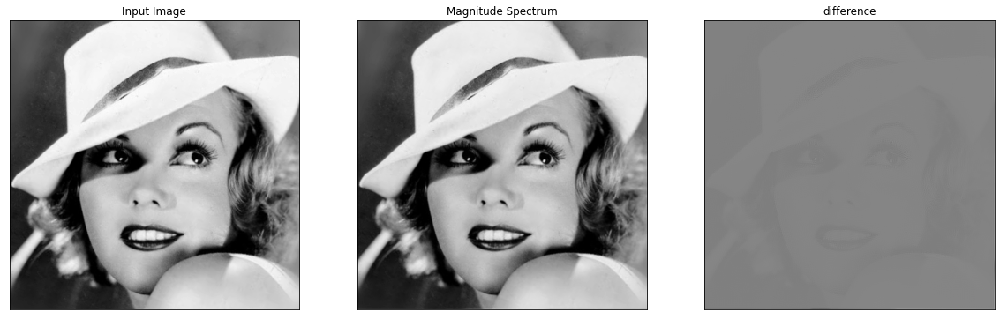

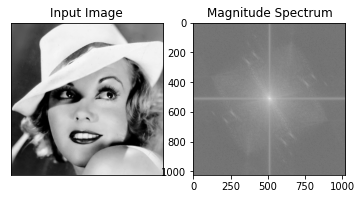

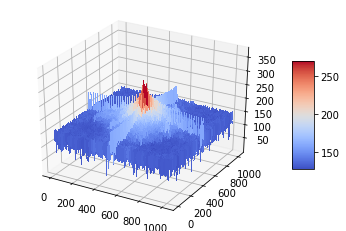

frequency=226, resolution=452


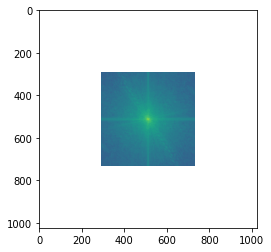

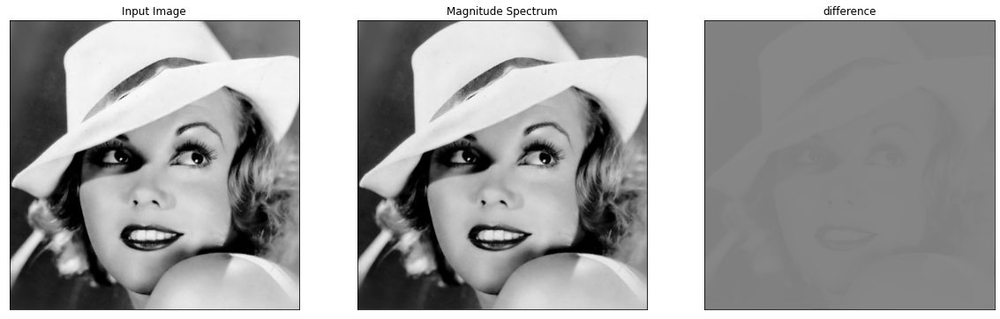

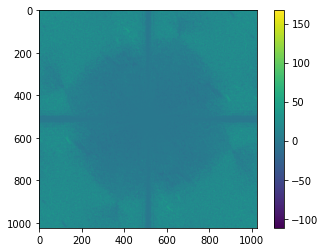

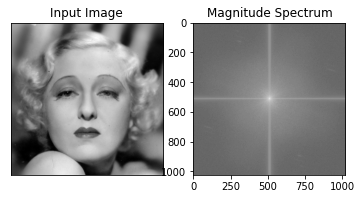

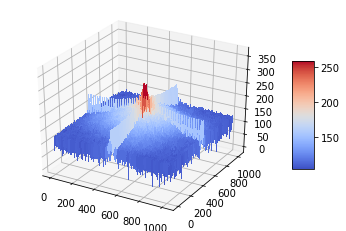

frequency=216, resolution=432


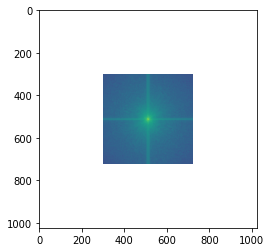

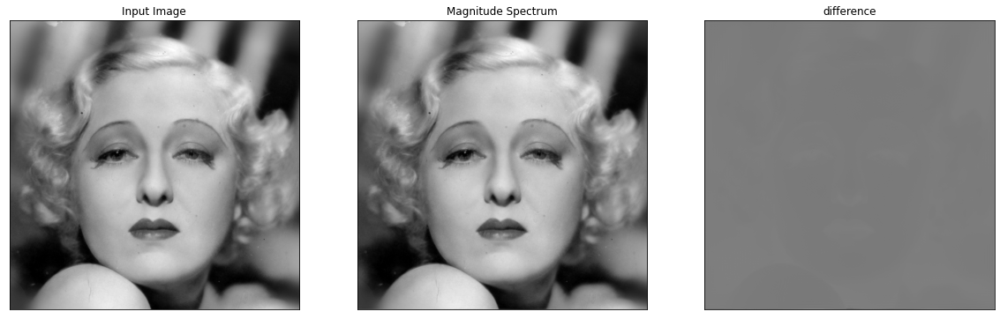

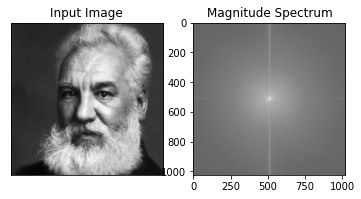

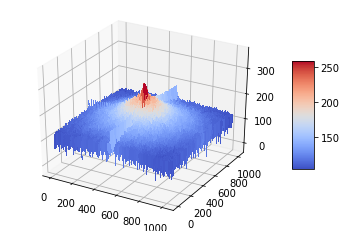

frequency=190, resolution=380


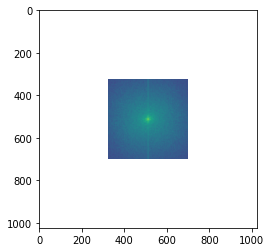

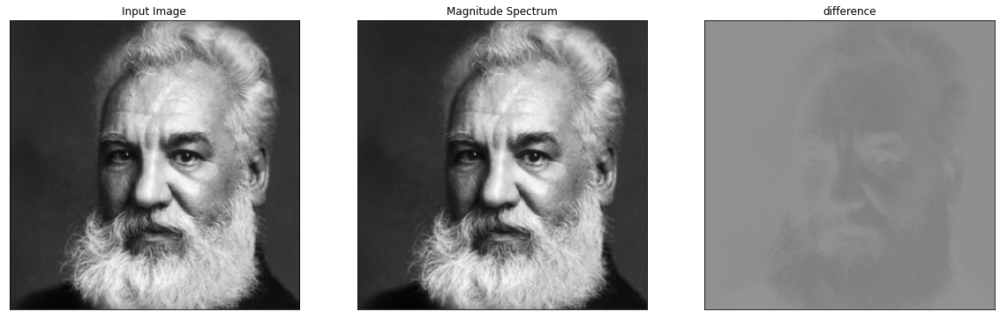

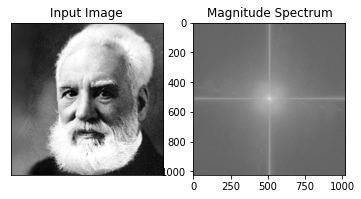

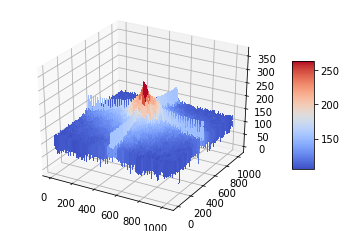

frequency=142, resolution=284


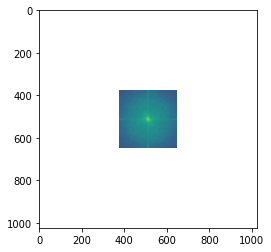

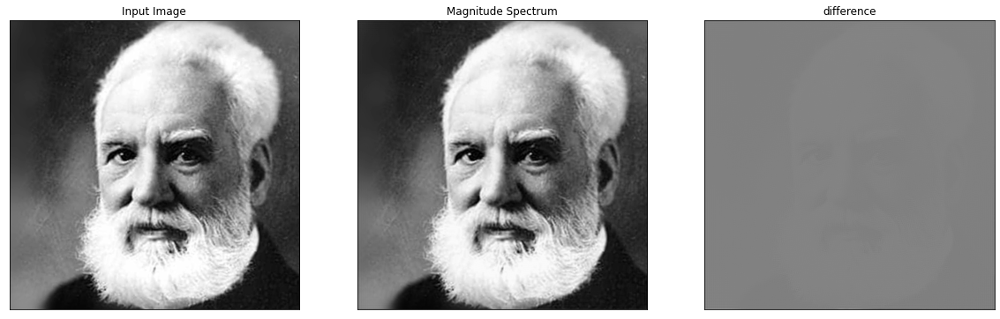

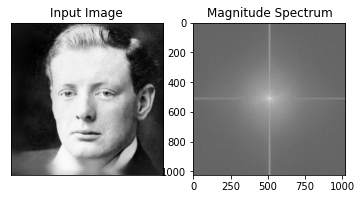

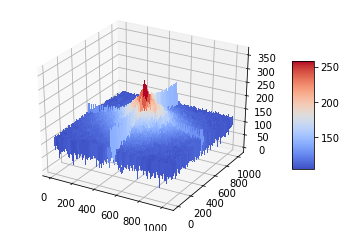

frequency=143, resolution=286


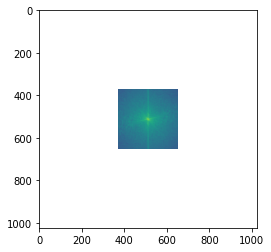

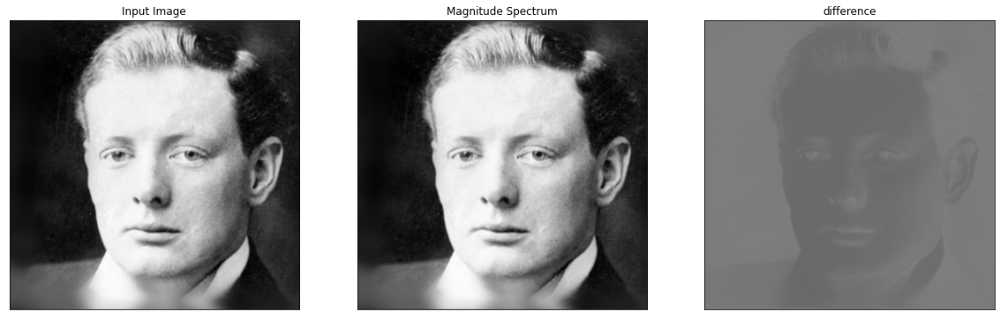

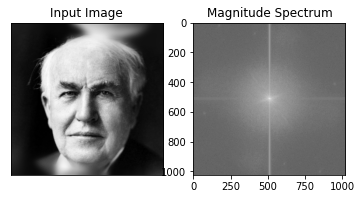

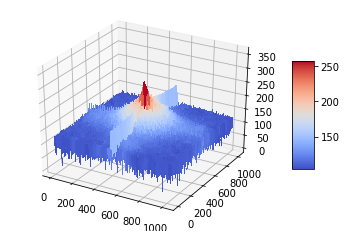

frequency=152, resolution=304


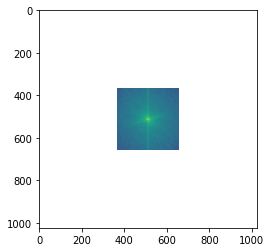

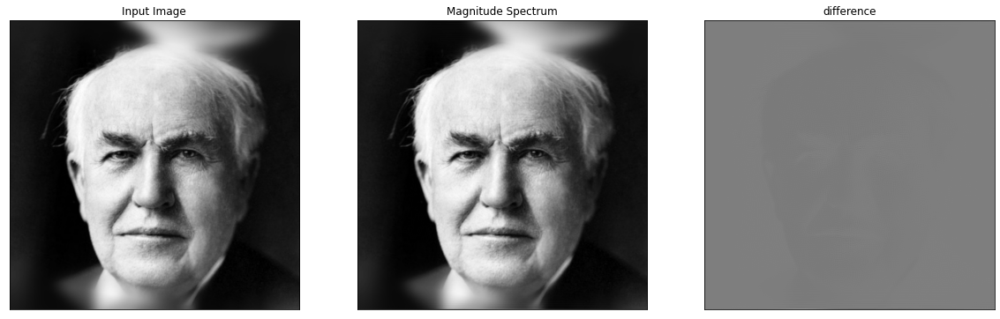

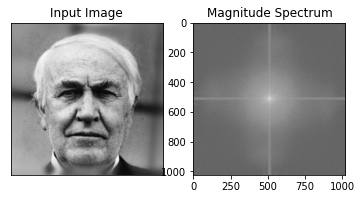

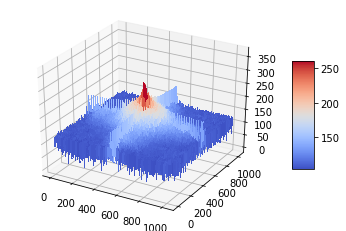

frequency=160, resolution=320


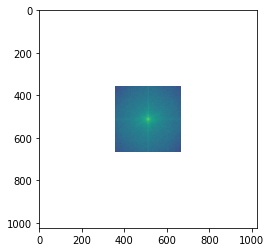

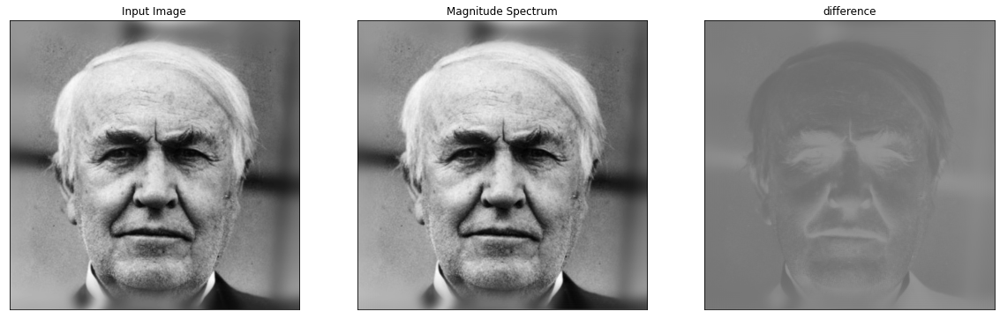

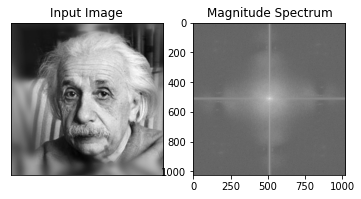

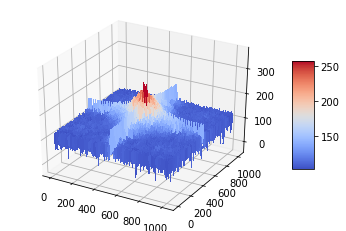

frequency=132, resolution=264


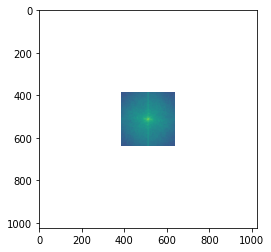

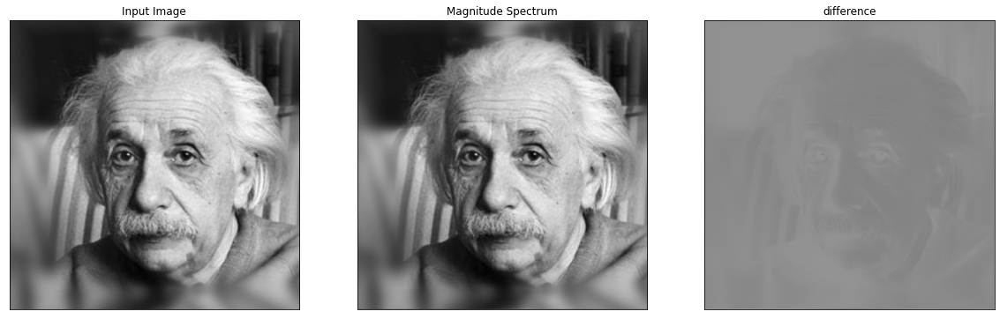

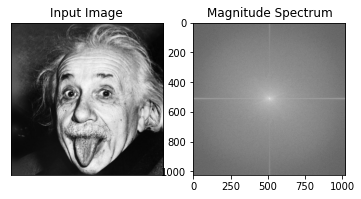

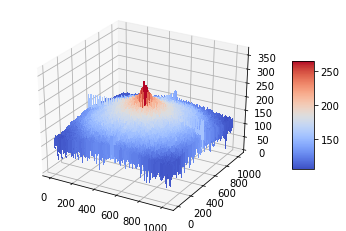

frequency=246, resolution=492


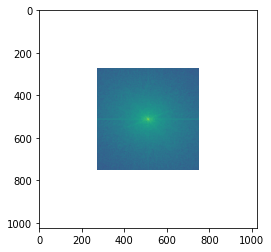

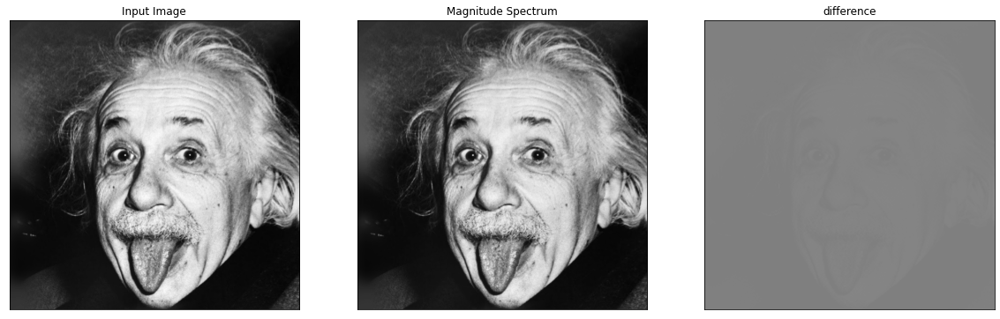

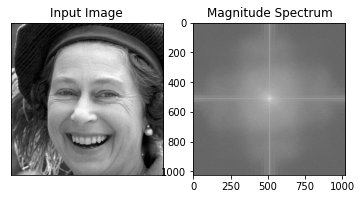

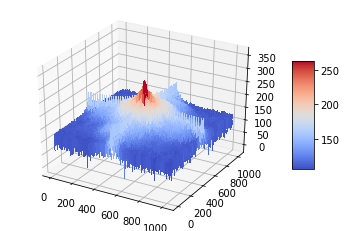

frequency=194, resolution=388


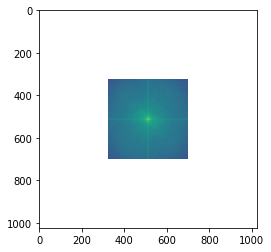

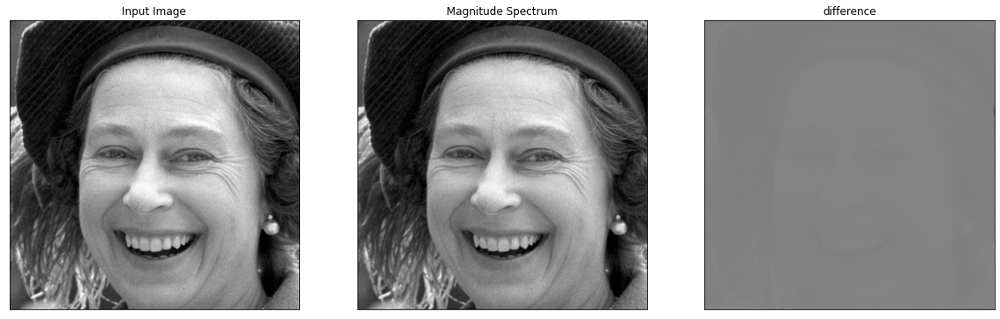

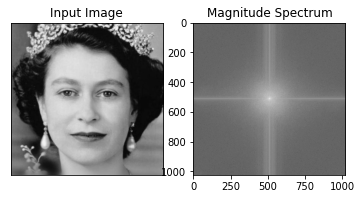

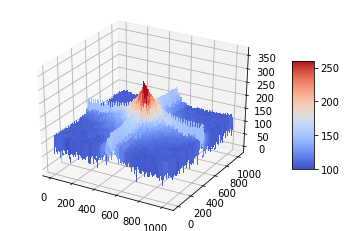

frequency=127, resolution=254


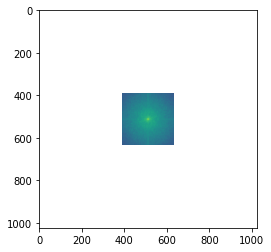

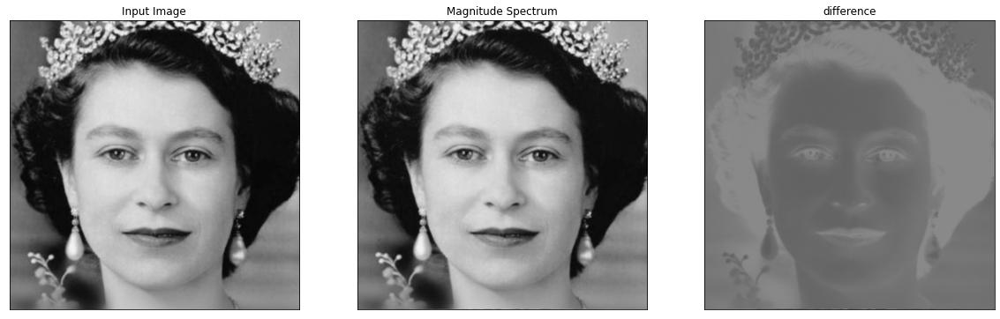

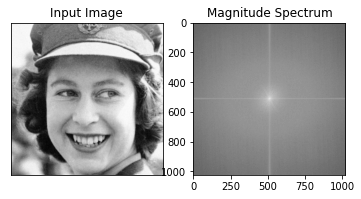

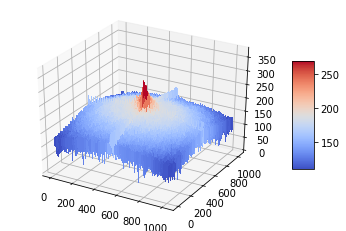

frequency=293, resolution=586


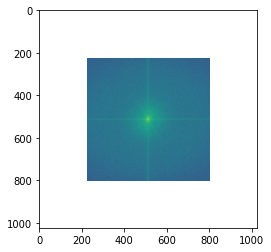

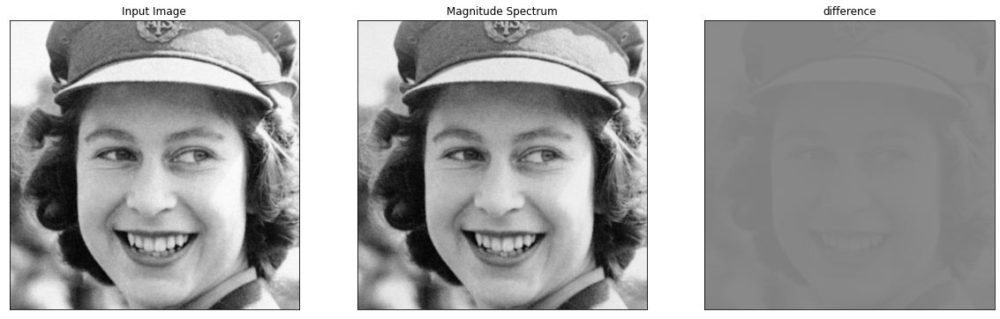

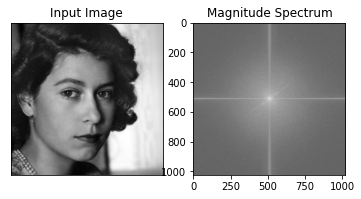

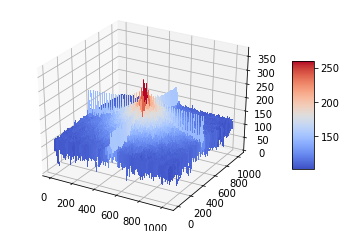

frequency=186, resolution=372


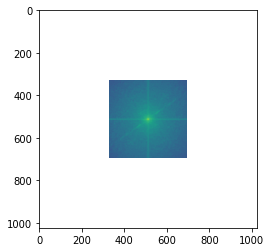

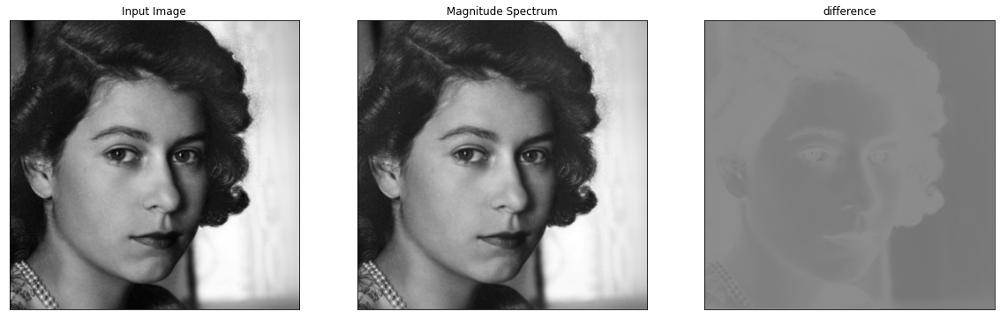

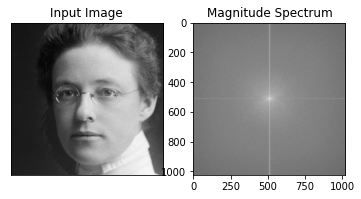

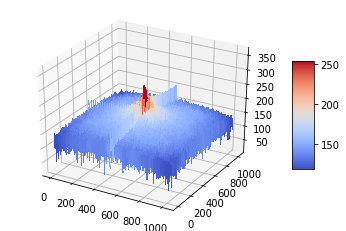

frequency=330, resolution=660


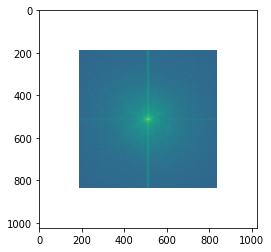

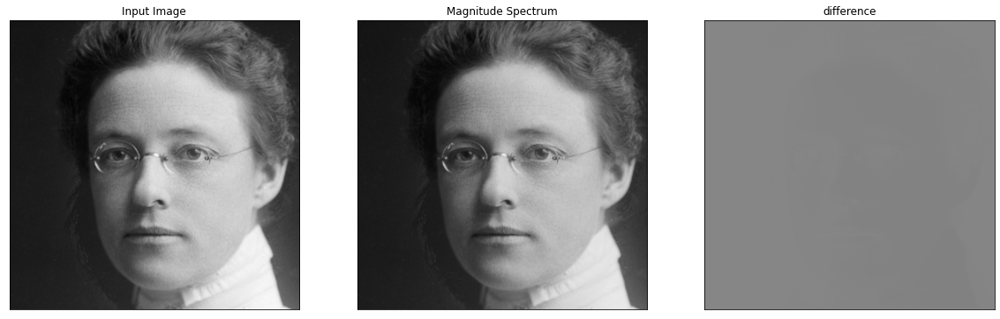

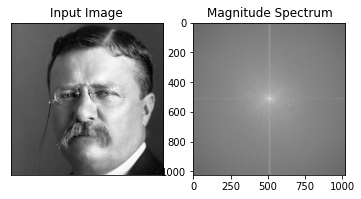

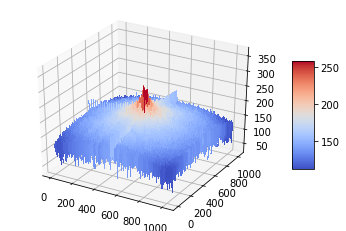

frequency=294, resolution=588


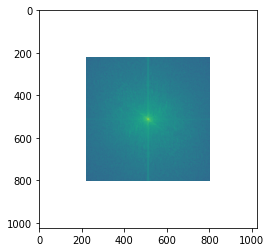

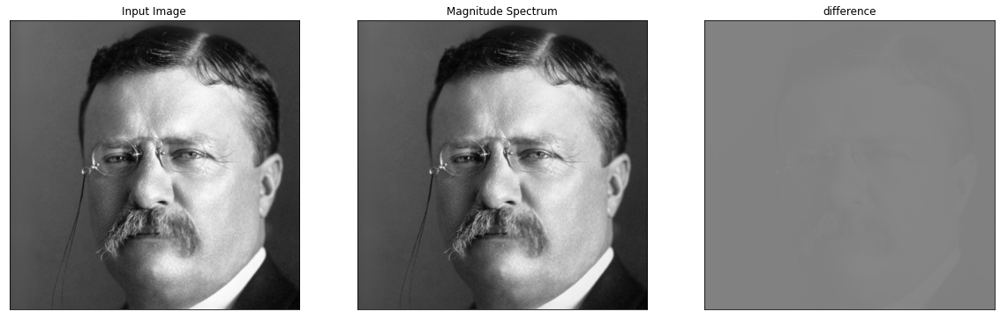

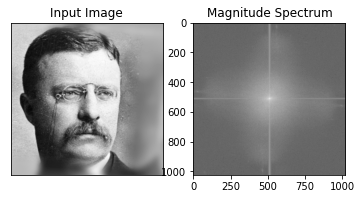

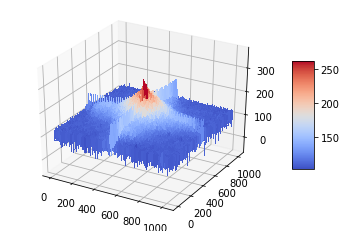

frequency=138, resolution=276


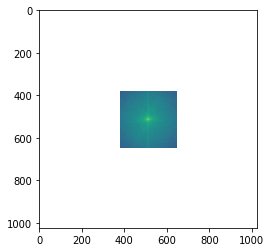

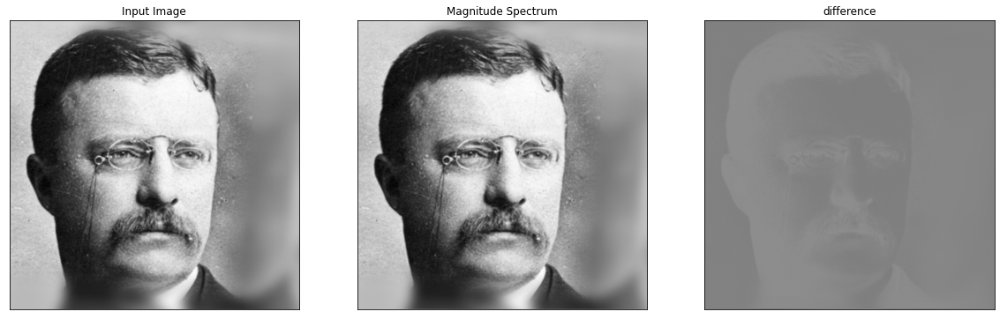

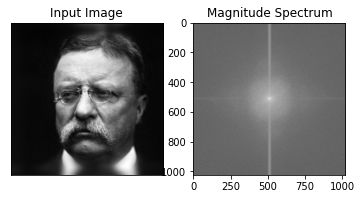

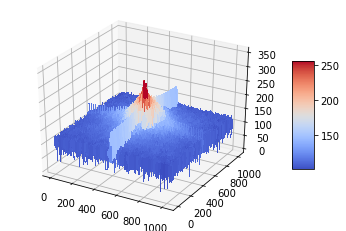

frequency=125, resolution=250


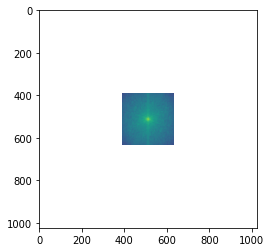

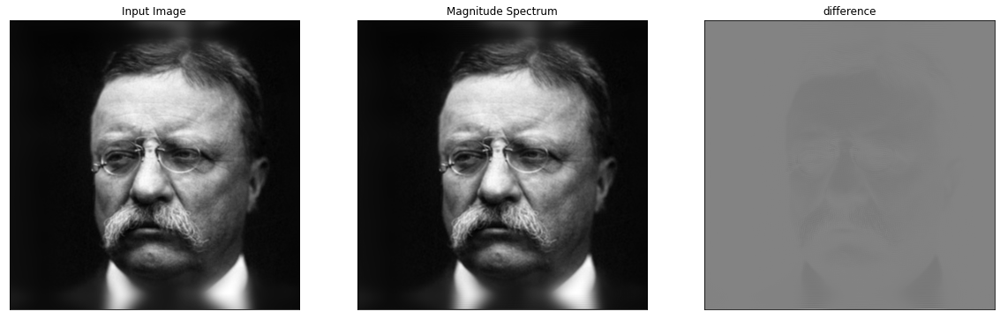

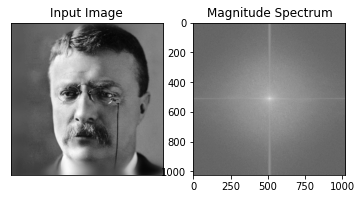

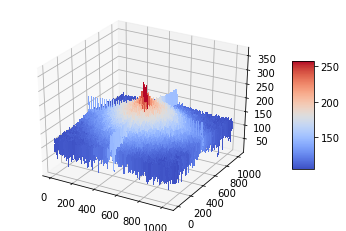

frequency=206, resolution=412


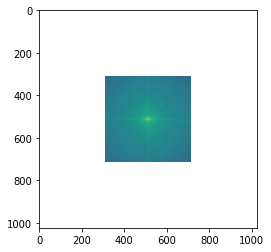

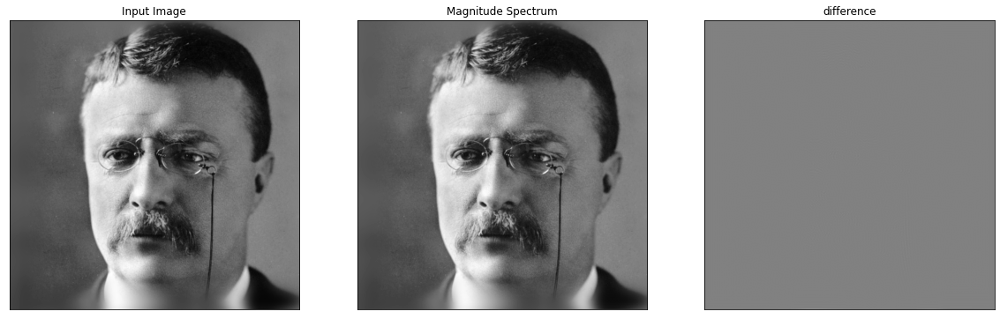

In [60]:
import os
from os.path import join as pjoin

import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np

def dft(img):
    dft = cv.dft(np.float32(img),flags = cv.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
#     dft_shift = dft
    magnitude_spectrum = 20*np.log(cv.magnitude(dft_shift[:,:,0],dft_shift[:,:,1]))
    return magnitude_spectrum, dft_shift


def get_cutoff(dft_shift, thresh=0.9):
    mag = cv.magnitude(dft_shift[:,:,0],dft_shift[:,:,1])
    sum_table = cv.integral(mag)
    rows, cols = mag.shape
    crow,ccol = rows//2 , cols//2
    assert sum_table.shape == (rows + 1, cols + 1)
    
    total = sum_table[-1, -1]
    mags = []
    for freq in range(min(crow, ccol)):
        b, t = crow - freq, crow + freq
        l, r = ccol - freq, ccol + freq
        rr, tt = r + 1, t + 1
        mag_f = sum_table[tt, rr] - sum_table[tt, l] - sum_table[b, rr] + sum_table[b, l]
        mags.append(mag_f)
        if mag_f / total > thresh:
            return freq


def plot_surface(im):
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    H, W = im.shape
    X = np.arange(W)
    Y = np.arange(H)
    X, Y = np.meshgrid(X, Y)
    Z = im

    # Plot the surface.
    surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                           linewidth=0, antialiased=False)

    # Add a color bar which maps values to colors.
    fig.colorbar(surf, shrink=0.5, aspect=5)

    plt.show()

def vis_dft(fn, denoised_dir, out_dir):
    fns = [fn]
    denoised_fn = pjoin(denoised_dir, os.path.basename(fn))
    if os.path.exists(denoised_fn):
        fns.append(denoised_fn)

    os.makedirs(out_dir, exist_ok=True)
    mags = []
    for fn in fns:
        img = cv.imread(fn,0)
#         img = img[879:74+879, 409: 409+166]
        magnitude_spectrum, dft_shift = dft(img)
        mags.append(magnitude_spectrum)
        plt.subplot(121),plt.imshow(img, cmap = 'gray')
        plt.title('Input Image'), plt.xticks([]), plt.yticks([])
        plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray', vmin=-50, vmax=350)
        plt.title('Magnitude Spectrum')#, plt.xticks([]), plt.yticks([])
        plt.show()
        plot_surface(magnitude_spectrum)
        
        rows, cols = img.shape
        crow,ccol = rows//2 , cols//2
        # create a mask first, center square is 1, remaining all zeros
        mask = np.zeros((rows,cols,2),np.uint8)
        r = get_cutoff(dft_shift, thresh=args.thresh)
        print(f"frequency={r}, resolution={2*r}")
        mask[crow-r:crow+r, ccol-r:ccol+r] = 1
#         apply mask and inverse DFT
        fshift = dft_shift *mask
        plt.imshow(20*np.log(cv.magnitude(fshift[:,:,0],fshift[:,:,1])))
        plt.show()
        
        f_ishift = np.fft.ifftshift(fshift)
        img_back = cv.idft(f_ishift)
        img_back = cv.magnitude(img_back[:,:,0],img_back[:,:,1])
        img_back = (img_back - img_back.min()) / (img_back.max() - img_back.min()) * 255
        plt.figure(figsize=(20,15))
        plt.subplot(131),plt.imshow(img, cmap = 'gray')
        plt.title('Input Image'), plt.xticks([]), plt.yticks([])
        plt.subplot(132),plt.imshow(img_back, cmap = 'gray');
        plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
        diff = (img - img_back + 127)/255
        plt.subplot(133),plt.imshow(np.stack((diff,)*3, axis=-1))
        plt.title('difference'), plt.xticks([]), plt.yticks([])
        plt.show()
        
        pre = os.path.splitext(os.path.basename(fn))[0]
        cv.imwrite(pjoin(out_dir, pre + f'_fft_t{args.thresh:02f}-f{r}.png'), img_back)
        cv.imwrite(pjoin(out_dir, os.path.basename(fn)), img)


    if len(mags) > 1:
        plt.imshow(mags[1] - mags[0])
        plt.colorbar()
        plt.show()

names = sorted(os.listdir(args.in_dir))
for name in names:
    vis_dft(pjoin(args.in_dir, name), args.denoised_dir, args.out_dir)